In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(rc={'figure.figsize':(11.7,8.27)})
pd.options.display.float_format = '{:20,.2f}'.format
import warnings
warnings.simplefilter("ignore")

from sklearn.feature_extraction.text import TfidfVectorizer
import pyLDAvis
import pyLDAvis.gensim_models
from gensim.models.coherencemodel import CoherenceModel
from gensim import corpora
from gensim.models import LdaModel
from gensim import matutils

In [2]:
data = pd.read_csv('./processed_text_almazov.csv')

In [3]:
data.head()

,Регистрационный номер,Номер эпизода,ФИО специалиста,Дата время выполнения,processed_text
0,6612/A19,13654/А2019,Гордеева Мария Сергеевна,2019-03-06 15:00:00.000,режим нагрузка общий рекомендация контроль дав...
1,5382/A19,NaN,Гордеева Мария Сергеевна,2019-03-06 15:30:00.000,режим нагрузка общий рекомендация ограничение ...
2,16663/A19,NaN,Гордеева Мария Сергеевна,2019-03-06 17:30:00.000,режим нагрузка общий рекомендация контроль дав...
3,16322/A19,NaN,Гордеева Мария Сергеевна,2019-03-07 18:00:00.000,режим нагрузка общий рекомендация контроль ад ...
4,18353/A19,NaN,Гордеева Мария Сергеевна,2019-03-12 12:30:00.000,режим нагрузка общий рекомендация контроль дав...


## Topic modeling

In [4]:
# Подготовка токенизированного текста
tokenized_texts = data['processed_text'].apply(lambda x: x.split()).tolist()

In [5]:
# 1. Векторизация текста (TF-IDF)
vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=1000)
tfidf_matrix = vectorizer.fit_transform(data['processed_text'])

In [6]:
# 2. Функция для визуализации pyLDAvis
def visualize_topics(lda_model, corpus, dictionary, num_topics):
    """
    Визуализирует темы с помощью pyLDAvis для заданного числа тем.
    """
    print(f'----------Topics number: {num_topics}----------')
    pyLDAvis.enable_notebook()
    panel = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary, mds='tsne')
    pyLDAvis.display(panel)

In [7]:
# 3. Функция для анализа когерентности и визуализации
def analyze_topics(data, tfidf_matrix, vectorizer, k_range):
    """
    Анализирует когерентность и визуализирует темы для каждого значения k.
    """
    dictionary = corpora.Dictionary(data['processed_text'].apply(lambda x: x.split()))
    corpus = [dictionary.doc2bow(text.split()) for text in data['processed_text']]
    
    # Проверка размеров
    print("Corpus size:", len(corpus))
    print("Dictionary size:", len(dictionary))
    
    coherence_values = []
    
    # Цикл по количеству тем
    for num_topics in k_range:
        print(f"LDA training for {num_topics} topics...")
        # Обучаем модель прямо в цикле
        lda_model = LdaModel(
            corpus=corpus,
            id2word=dictionary,
            num_topics=num_topics,
            random_state=42,
            passes=10,
            iterations=100,
            alpha='auto'
        )
        
        # Рассчитываем когерентность
        coherencemodel = CoherenceModel(
            model=lda_model,
            texts=tokenized_texts,
            dictionary=dictionary,
            coherence='c_v'
        )
        coherence_score = coherencemodel.get_coherence()
        coherence_values.append((num_topics, coherence_score))
        
        # Визуализируем темы
        visualize_topics(lda_model, corpus, dictionary, num_topics)
    
    # Визуализация графика когерентности
    x = [k for k in k_range]
    y = [k[1] for k in coherence_values]
    plt.figure(figsize=(10, 6))
    plt.plot(x, y, marker='o')
    plt.xlabel("Num Topics")
    plt.ylabel("Coherence Score")
    plt.title("Dependence of coherence on the number of topics")
    plt.grid(True)
    plt.show()
    
    # Печать всех значений когерентности
    for num_topics, score in coherence_values:
        print(f"Num Topics: {num_topics}, Coherence Score: {score:.4f}")

Corpus size: 28124
Dictionary size: 3614
LDA training for 2 topics...
----------Topics number: 2----------
LDA training for 3 topics...
----------Topics number: 3----------
LDA training for 4 topics...
----------Topics number: 4----------
LDA training for 5 topics...
----------Topics number: 5----------
LDA training for 6 topics...
----------Topics number: 6----------
LDA training for 7 topics...
----------Topics number: 7----------
LDA training for 8 topics...
----------Topics number: 8----------
LDA training for 9 topics...
----------Topics number: 9----------
LDA training for 10 topics...
----------Topics number: 10----------
LDA training for 11 topics...
----------Topics number: 11----------
LDA training for 12 topics...
----------Topics number: 12----------
LDA training for 13 topics...
----------Topics number: 13----------
LDA training for 14 topics...
----------Topics number: 14----------
LDA training for 15 topics...
----------Topics number: 15----------
LDA training for 16 top

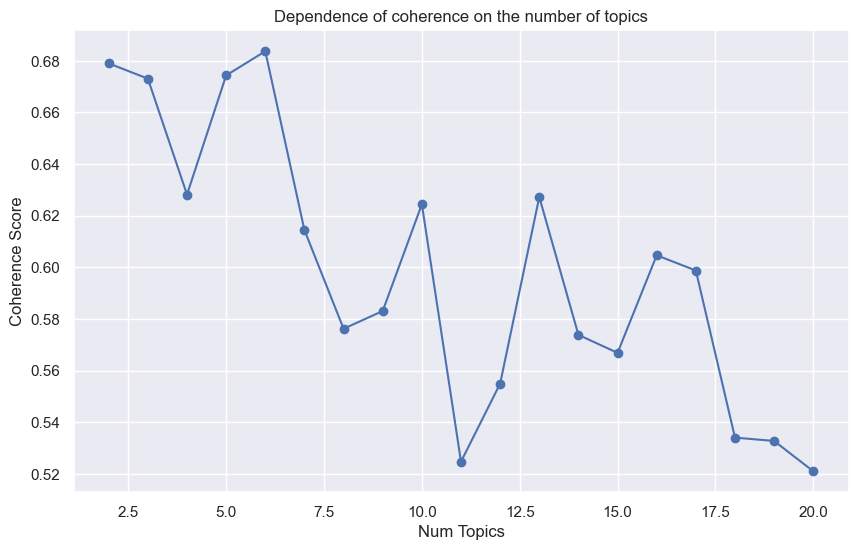

Num Topics: 2, Coherence Score: 0.6790
Num Topics: 3, Coherence Score: 0.6731
Num Topics: 4, Coherence Score: 0.6282
Num Topics: 5, Coherence Score: 0.6744
Num Topics: 6, Coherence Score: 0.6837
Num Topics: 7, Coherence Score: 0.6144
Num Topics: 8, Coherence Score: 0.5762
Num Topics: 9, Coherence Score: 0.5831
Num Topics: 10, Coherence Score: 0.6244
Num Topics: 11, Coherence Score: 0.5247
Num Topics: 12, Coherence Score: 0.5550
Num Topics: 13, Coherence Score: 0.6272
Num Topics: 14, Coherence Score: 0.5738
Num Topics: 15, Coherence Score: 0.5669
Num Topics: 16, Coherence Score: 0.6047
Num Topics: 17, Coherence Score: 0.5988
Num Topics: 18, Coherence Score: 0.5340
Num Topics: 19, Coherence Score: 0.5327
Num Topics: 20, Coherence Score: 0.5210


In [8]:
# 5. Вызов функции анализа
k_range = range(2, 21)
analyze_topics(data, tfidf_matrix, vectorizer, k_range)

## Применение LDA

In [9]:
# Получаем словарь и корпус
dictionary = corpora.Dictionary(data['processed_text'].apply(lambda x: x.split()))
corpus = [dictionary.doc2bow(text.split()) for text in data['processed_text']]

In [10]:
# Обучение LDA модели с фиксированным числом топиков
num_topics = 6
lda_model = LdaModel(
    corpus=corpus,
    id2word=dictionary,
    num_topics=num_topics,
    random_state=42,
    passes=10,
    iterations=100,
    alpha='auto'
)

# Визуализация pyLDAvis для финальной модели
pyLDAvis.enable_notebook()
panel = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary, mds='tsne')
pyLDAvis.display(panel)

In [11]:
# Функция для присвоения доминирующей темы
def get_dominant_topic(text, lda_model, dictionary):
    text_bow = dictionary.doc2bow(text.split())
    topic_probabilities = lda_model.get_document_topics(text_bow)
    dominant_topic = max(topic_probabilities, key=lambda item: item[1])[0]
    return dominant_topic

In [12]:
# Присваиваем доминирующую тему
data['dominant_topic'] = data['processed_text'].apply(lambda x: get_dominant_topic(x, lda_model, dictionary))

In [13]:
# Функция для получения топ-слов для каждой темы
def get_topic_top_words(lda_model, num_words=10):
    topic_words = {}
    for topic_id in range(lda_model.num_topics):
        top_words = [word for word, prob in lda_model.show_topic(topic_id, topn=num_words)]
        topic_words[topic_id] = top_words
    return topic_words

In [14]:
# Создаем словарь соответствия между номерами тем и топ-словами
topic_top_words = get_topic_top_words(lda_model)

In [15]:
# Выводим соответствие тем
print("Соответствие тем:")
for topic_id, words in topic_top_words.items():
    print(f"Тема {topic_id} (LDA, начиная с 0): {words}")

Соответствие тем:
Тема 0 (LDA, начиная с 0): ['ад', 'время', 'минута', 'мм', 'ст', 'рт', 'средний', 'один', 'приём', 'дневник']
Тема 1 (LDA, начиная с 0): ['нагрузка', 'физический', 'менее', 'контроль', 'снижение', 'отдых', 'режим', 'труд', 'общий', 'ходьба']
Тема 2 (LDA, начиная с 0): ['ад', 'контроль', 'нагрузка', 'пульс', 'дневник', 'утро', 'вечер', 'режим', 'физ', 'рекомендация']
Тема 3 (LDA, начиная с 0): ['физический', 'неделя', 'нагрузка', 'умеренный', 'менее', 'динамический', 'мина', 'день', 'аэробный', 'упражнение']
Тема 4 (LDA, начиная с 0): ['м', 'контроль', 'кровь', 'кардиолог', 'экг', 'анализ', 'консультация', 'наблюдение', 'год', 'запись']
Тема 5 (LDA, начиная с 0): ['измерение', 'самоконтроль', 'ад', 'домашний', 'дневник', 'давление', 'артериальный', 'условие', 'электронный', 'ведение']


In [16]:
# Распределение тем
print(data['dominant_topic'].value_counts())

dominant_topic
2    15293
1     5620
3     4024
4     1704
5     1125
0      358
Name: count, dtype: int64


## Clustering

In [17]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
import plotly.express as px
import umap

In [18]:
# Функция для поиска оптимального eps для DBSCAN с визуализацией
def find_optimal_eps(matrix, n_neighbors=5, plot=False):
    """
    Находит оптимальное значение eps для DBSCAN с помощью метода "локтя".
    """
    neighbors = NearestNeighbors(n_neighbors=n_neighbors)
    neighbors_fit = neighbors.fit(matrix)
    distances, indices = neighbors_fit.kneighbors(matrix)
    distances = np.sort(distances[:, 1], axis=0)
    
    # Ищем "локоть"
    diffs = np.diff(distances)
    try:
        optimal_index = np.argmax(diffs)
        optimal_eps = distances[optimal_index]
    except ValueError:
        optimal_eps = 0.5  # Запасное значение
    
    # Визуализация графика расстояний (опционально)
    if plot:
        plt.figure(figsize=(8, 4))
        plt.plot(distances)
        plt.axhline(y=optimal_eps, color='r', linestyle='--', label=f'eps={optimal_eps:.2f}')
        plt.xlabel("Sorted points")
        plt.ylabel(f"Distance to {n_neighbors} neighbor")
        plt.title("Elbow method for selecting eps (DBSCAN)")
        plt.legend()
        plt.grid(True)
        plt.show()
    
    return optimal_eps

In [19]:
# Функция для расчета диаметра кластера
def calculate_cluster_diameter(matrix, cluster_labels, cluster_id):
    """
    Вычисляет диаметр кластера (максимальное расстояние между точками) для заданного cluster_id.
    """
    cluster_indices = np.where(cluster_labels == cluster_id)[0]
    if len(cluster_indices) < 2:
        return 0.0  # Если в кластере меньше 2 точек, диаметр = 0
    
    cluster_points = matrix[cluster_indices]
    distances = []
    for i in range(len(cluster_points)):
        for j in range(i + 1, len(cluster_points)):
            dist = np.linalg.norm(cluster_points[i] - cluster_points[j])
            distances.append(dist)
    return max(distances) if distances else 0.0

In [20]:
# Функция для векторизации и кластеризации внутри темы с использованием DBSCAN
def cluster_within_topic(data, topic_id, global_tfidf_matrix=None):
    """
    Векторизует и кластеризует данные внутри определенной темы, используя DBSCAN.
    Возвращает матрицу TF-IDF, метки кластеров и подмножество данных.
    """
    topic_df = data[data['dominant_topic'] == topic_id]
    if len(topic_df) <= 1:
        return None
    
    # Векторизация
    if global_tfidf_matrix is None:
        vectorizer_topic = TfidfVectorizer(max_df=0.95, min_df=2, max_features=1000)
        tfidf_matrix_topic = vectorizer_topic.fit_transform(topic_df['processed_text'])
    else:
        indices = topic_df.index
        tfidf_matrix_topic = global_tfidf_matrix[indices]
    
    # Ищем оптимальное значение eps
    optimal_eps = find_optimal_eps(tfidf_matrix_topic.toarray(), plot=True)
    
    # Кластеризация с DBSCAN
    dbscan = DBSCAN(eps=optimal_eps, min_samples=3)
    cluster_labels = dbscan.fit_predict(tfidf_matrix_topic)
    
    # Проверка, были ли созданы кластеры
    if len(np.unique(cluster_labels)) <= 1 and np.unique(cluster_labels)[0] == -1:
        return None
    
    # Оценка качества кластеризации (силуэтный коэффициент, исключая шум)
    non_noise_indices = cluster_labels != -1
    if np.sum(non_noise_indices) > 1 and len(np.unique(cluster_labels[non_noise_indices])) > 1:
        silhouette = silhouette_score(tfidf_matrix_topic[non_noise_indices], cluster_labels[non_noise_indices])
        print(f"Silhouette score for topic {topic_id}: {silhouette:.4f}")
    
    return tfidf_matrix_topic, cluster_labels, topic_df

In [21]:
# Функция для визуализации кластеризации
def visualize_clusters(tfidf_matrix_topic, cluster_labels, topic_df, topic_id, method="tsne"):
    """
    Снижает размерность (t-SNE или UMAP) и визуализирует кластеры с диаметрами.
    """
    # Выбираем метод снижения размерности
    if method.lower() == "tsne":
        tsne = TSNE(n_components=3, random_state=42, perplexity=min(5, len(topic_df) - 1))
        reduced_matrix = tsne.fit_transform(tfidf_matrix_topic.toarray())
        dim1, dim2, dim3 = "TSNE Dimension 1", "TSNE Dimension 2", "TSNE Dimension 3"
    else:  # UMAP
        reducer = umap.UMAP(n_components=3, random_state=42, n_neighbors=5, min_dist=0.1, n_jobs=-1)
        reduced_matrix = reducer.fit_transform(tfidf_matrix_topic.toarray())
        dim1, dim2, dim3 = "UMAP Dimension 1", "UMAP Dimension 2", "UMAP Dimension 3"
    
    # Создаем DataFrame для визуализации
    vis_df = pd.DataFrame({
        dim1: reduced_matrix[:, 0],
        dim2: reduced_matrix[:, 1],
        dim3: reduced_matrix[:, 2],
        'Cluster': cluster_labels
    }, index=topic_df.index)
    
    # Вычисляем диаметры для каждого кластера
    unique_clusters = np.unique(cluster_labels)
    cluster_diameters = {}
    for cluster_id in unique_clusters:
        if cluster_id != -1:  # Исключаем шум
            diameter = calculate_cluster_diameter(reduced_matrix, cluster_labels, cluster_id)
            cluster_diameters[cluster_id] = diameter
            print(f"Topic {topic_id}, Cluster {cluster_id}: Diameter = {diameter:.4f}")
    
    # Добавляем диаметры в визуализацию (в виде текста)
    annotations = []
    for cluster_id, diameter in cluster_diameters.items():
        cluster_center = vis_df[vis_df['Cluster'] == cluster_id].mean()
        annotations.append(
            dict(
                x=cluster_center[dim1],
                y=cluster_center[dim2],
                z=cluster_center[dim3],
                text=f"Cluster {cluster_id}<br>Diameter: {diameter:.4f}",
                showarrow=True,
                arrowhead=2
            )
        )
    
    # Визуализация с помощью Plotly Express
    fig = px.scatter_3d(
        vis_df,
        x=dim1,
        y=dim2,
        z=dim3,
        color='Cluster',
        title=f'Clustering (DBSCAN) for topic {topic_id} ({method.upper()})',
        color_discrete_sequence=px.colors.qualitative.Dark24
    )
    fig.update_layout(scene=dict(annotations=annotations))
#     fig.write_html(f"cluster_topic_{topic_id}_{method.lower()}.html")
    fig.show()

In [22]:
# Применяем кластеризацию для каждой темы, сохраняем метки и визуализируем
# Создаем столбцы для всех тем заранее
for topic_id in range(num_topics):
    data[f'cluster_topic_{topic_id}'] = np.nan

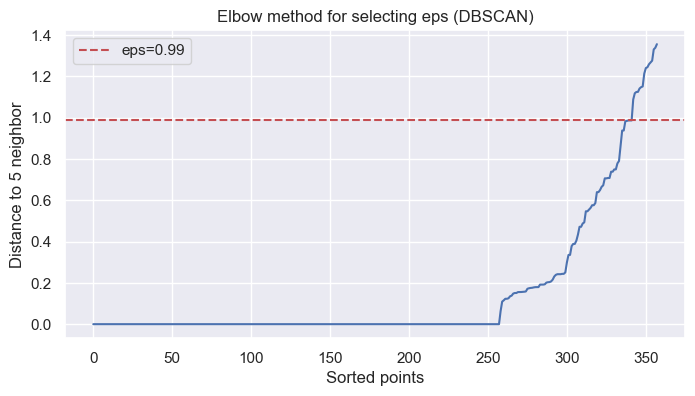

Silhouette score for topic 0: 0.4166
Topic 0, Cluster 0: Diameter = 13.1471
Topic 0, Cluster 1: Diameter = 40.8246
Topic 0, Cluster 2: Diameter = 16.3181
Topic 0, Cluster 3: Diameter = 294.6933
Topic 0, Cluster 4: Diameter = 142.7437
Topic 0, Cluster 5: Diameter = 22.7953
Topic 0, Cluster 6: Diameter = 27.7981
Topic 0, Cluster 7: Diameter = 8.1138
Topic 0, Cluster 8: Diameter = 16.0992


Topic 0, Cluster 0: Diameter = 0.0861
Topic 0, Cluster 1: Diameter = 0.8312
Topic 0, Cluster 2: Diameter = 0.3139
Topic 0, Cluster 3: Diameter = 29.2852
Topic 0, Cluster 4: Diameter = 38.4827
Topic 0, Cluster 5: Diameter = 0.2416
Topic 0, Cluster 6: Diameter = 0.5288
Topic 0, Cluster 7: Diameter = 0.1194
Topic 0, Cluster 8: Diameter = 0.1647


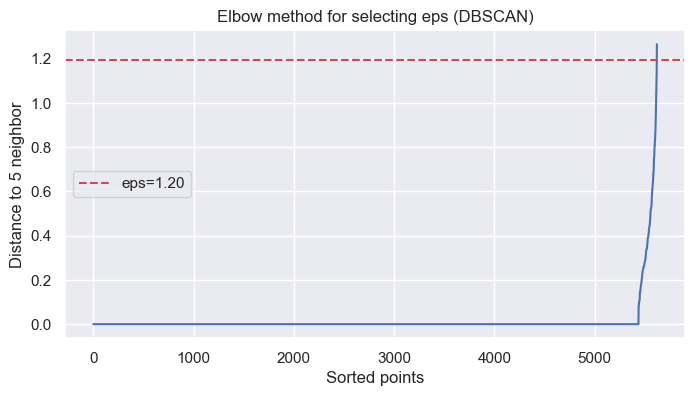

Topic 1, Cluster 0: Diameter = 875.1877


Topic 1, Cluster 0: Diameter = 39.0497


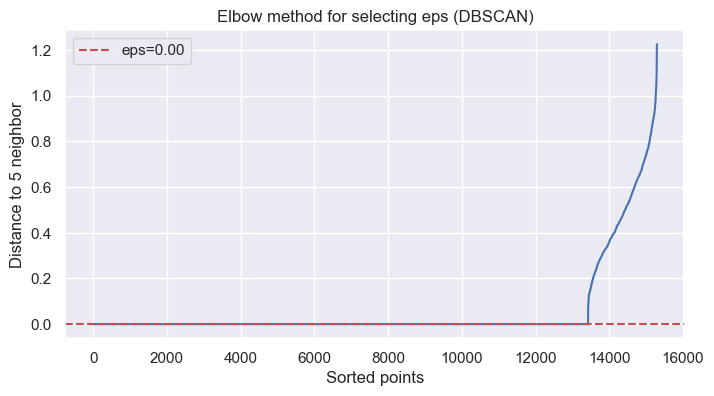

Silhouette score for topic 2: 1.0000
Topic 2, Cluster 0: Diameter = 0.0000
Topic 2, Cluster 1: Diameter = 3.0438
Topic 2, Cluster 2: Diameter = 0.0008
Topic 2, Cluster 3: Diameter = 2.0080
Topic 2, Cluster 4: Diameter = 0.5355
Topic 2, Cluster 5: Diameter = 0.0007
Topic 2, Cluster 6: Diameter = 2.4393
Topic 2, Cluster 7: Diameter = 222.0946
Topic 2, Cluster 8: Diameter = 0.0000
Topic 2, Cluster 9: Diameter = 4.1427
Topic 2, Cluster 10: Diameter = 2.8103
Topic 2, Cluster 11: Diameter = 44.8899
Topic 2, Cluster 12: Diameter = 0.0000
Topic 2, Cluster 13: Diameter = 2.0302
Topic 2, Cluster 14: Diameter = 3.4301
Topic 2, Cluster 15: Diameter = 0.0000
Topic 2, Cluster 16: Diameter = 0.0000
Topic 2, Cluster 17: Diameter = 2.5870
Topic 2, Cluster 18: Diameter = 0.0017
Topic 2, Cluster 19: Diameter = 0.0000
Topic 2, Cluster 20: Diameter = 0.0002
Topic 2, Cluster 21: Diameter = 0.0000
Topic 2, Cluster 22: Diameter = 2.0844
Topic 2, Cluster 23: Diameter = 1.8871
Topic 2, Cluster 24: Diameter = 0.

Topic 2, Cluster 265: Diameter = 3.1735
Topic 2, Cluster 266: Diameter = 3.0159
Topic 2, Cluster 267: Diameter = 140.4046
Topic 2, Cluster 268: Diameter = 4.1759
Topic 2, Cluster 269: Diameter = 5.0814
Topic 2, Cluster 270: Diameter = 2.0121
Topic 2, Cluster 271: Diameter = 3.2831
Topic 2, Cluster 272: Diameter = 0.0011
Topic 2, Cluster 273: Diameter = 0.0002
Topic 2, Cluster 274: Diameter = 3.8995
Topic 2, Cluster 275: Diameter = 0.0000
Topic 2, Cluster 276: Diameter = 1.9935
Topic 2, Cluster 277: Diameter = 0.0000
Topic 2, Cluster 278: Diameter = 1.9891
Topic 2, Cluster 279: Diameter = 0.0011
Topic 2, Cluster 280: Diameter = 0.0000
Topic 2, Cluster 281: Diameter = 0.0000
Topic 2, Cluster 282: Diameter = 3.3213
Topic 2, Cluster 283: Diameter = 0.0000
Topic 2, Cluster 284: Diameter = 2.1146
Topic 2, Cluster 285: Diameter = 0.0024
Topic 2, Cluster 286: Diameter = 2.6918
Topic 2, Cluster 287: Diameter = 0.0000
Topic 2, Cluster 288: Diameter = 3.9957
Topic 2, Cluster 289: Diameter = 2.443

Topic 2, Cluster 0: Diameter = 0.0004
Topic 2, Cluster 1: Diameter = 0.9753
Topic 2, Cluster 2: Diameter = 0.0679
Topic 2, Cluster 3: Diameter = 0.1048
Topic 2, Cluster 4: Diameter = 0.0566
Topic 2, Cluster 5: Diameter = 0.0003
Topic 2, Cluster 6: Diameter = 0.4217
Topic 2, Cluster 7: Diameter = 19.0150
Topic 2, Cluster 8: Diameter = 0.0004
Topic 2, Cluster 9: Diameter = 11.7352
Topic 2, Cluster 10: Diameter = 8.0019
Topic 2, Cluster 11: Diameter = 21.2995
Topic 2, Cluster 12: Diameter = 0.0030
Topic 2, Cluster 13: Diameter = 0.0697
Topic 2, Cluster 14: Diameter = 1.0783
Topic 2, Cluster 15: Diameter = 0.1041
Topic 2, Cluster 16: Diameter = 0.0127
Topic 2, Cluster 17: Diameter = 3.8556
Topic 2, Cluster 18: Diameter = 0.0014
Topic 2, Cluster 19: Diameter = 0.0082
Topic 2, Cluster 20: Diameter = 0.0006
Topic 2, Cluster 21: Diameter = 0.0714
Topic 2, Cluster 22: Diameter = 0.1027
Topic 2, Cluster 23: Diameter = 0.0702
Topic 2, Cluster 24: Diameter = 0.0004
Topic 2, Cluster 25: Diameter = 

Topic 2, Cluster 265: Diameter = 7.7670
Topic 2, Cluster 266: Diameter = 0.1810
Topic 2, Cluster 267: Diameter = 11.6287
Topic 2, Cluster 268: Diameter = 12.3236
Topic 2, Cluster 269: Diameter = 9.7361
Topic 2, Cluster 270: Diameter = 0.0892
Topic 2, Cluster 271: Diameter = 6.8427
Topic 2, Cluster 272: Diameter = 0.0617
Topic 2, Cluster 273: Diameter = 0.0003
Topic 2, Cluster 274: Diameter = 20.9891
Topic 2, Cluster 275: Diameter = 0.0007
Topic 2, Cluster 276: Diameter = 0.1492
Topic 2, Cluster 277: Diameter = 0.0002
Topic 2, Cluster 278: Diameter = 0.2160
Topic 2, Cluster 279: Diameter = 0.0032
Topic 2, Cluster 280: Diameter = 0.0197
Topic 2, Cluster 281: Diameter = 0.0013
Topic 2, Cluster 282: Diameter = 1.1106
Topic 2, Cluster 283: Diameter = 0.0037
Topic 2, Cluster 284: Diameter = 0.1405
Topic 2, Cluster 285: Diameter = 0.0123
Topic 2, Cluster 286: Diameter = 6.0966
Topic 2, Cluster 287: Diameter = 0.1219
Topic 2, Cluster 288: Diameter = 11.1644
Topic 2, Cluster 289: Diameter = 9.4

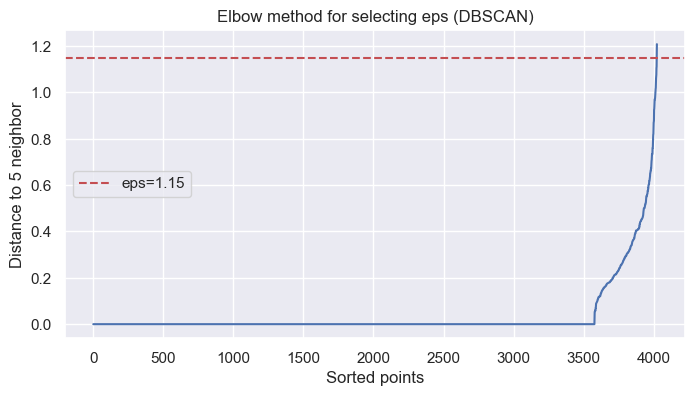

Silhouette score for topic 3: 0.1718
Topic 3, Cluster 0: Diameter = 222.3376
Topic 3, Cluster 1: Diameter = 0.0000


Topic 3, Cluster 0: Diameter = 36.3091
Topic 3, Cluster 1: Diameter = 0.0200


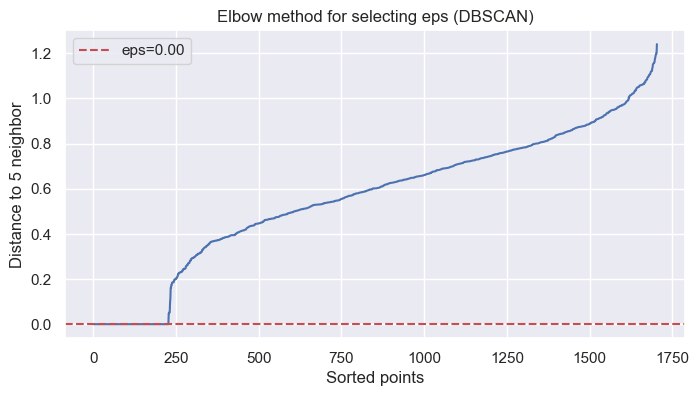

Silhouette score for topic 4: 1.0000
Topic 4, Cluster 0: Diameter = 0.0000
Topic 4, Cluster 1: Diameter = 4.1943
Topic 4, Cluster 2: Diameter = 0.0011
Topic 4, Cluster 3: Diameter = 6.6666
Topic 4, Cluster 4: Diameter = 4.6659
Topic 4, Cluster 5: Diameter = 1.4059
Topic 4, Cluster 6: Diameter = 2.1980
Topic 4, Cluster 7: Diameter = 0.0000
Topic 4, Cluster 8: Diameter = 0.0000
Topic 4, Cluster 9: Diameter = 0.0000
Topic 4, Cluster 10: Diameter = 0.5832
Topic 4, Cluster 11: Diameter = 0.2622
Topic 4, Cluster 12: Diameter = 0.0006
Topic 4, Cluster 13: Diameter = 0.4367
Topic 4, Cluster 14: Diameter = 0.0002
Topic 4, Cluster 15: Diameter = 0.0000
Topic 4, Cluster 16: Diameter = 0.0000
Topic 4, Cluster 17: Diameter = 0.0000


Topic 4, Cluster 0: Diameter = 0.0632
Topic 4, Cluster 1: Diameter = 0.2555
Topic 4, Cluster 2: Diameter = 0.0877
Topic 4, Cluster 3: Diameter = 0.4816
Topic 4, Cluster 4: Diameter = 0.1874
Topic 4, Cluster 5: Diameter = 0.0962
Topic 4, Cluster 6: Diameter = 0.2214
Topic 4, Cluster 7: Diameter = 0.2452
Topic 4, Cluster 8: Diameter = 0.0441
Topic 4, Cluster 9: Diameter = 0.0282
Topic 4, Cluster 10: Diameter = 0.0840
Topic 4, Cluster 11: Diameter = 0.0431
Topic 4, Cluster 12: Diameter = 0.0421
Topic 4, Cluster 13: Diameter = 0.0295
Topic 4, Cluster 14: Diameter = 0.1219
Topic 4, Cluster 15: Diameter = 0.0389
Topic 4, Cluster 16: Diameter = 0.0192
Topic 4, Cluster 17: Diameter = 0.0981


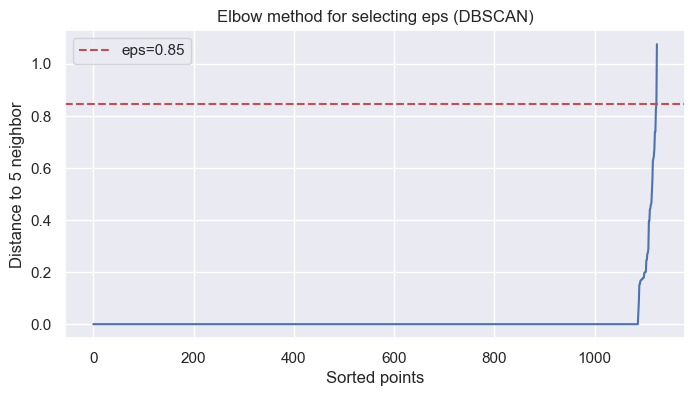

Silhouette score for topic 5: 0.4172
Topic 5, Cluster 0: Diameter = 123.2302
Topic 5, Cluster 1: Diameter = 50.7279
Topic 5, Cluster 2: Diameter = 12.2150
Topic 5, Cluster 3: Diameter = 0.0000
Topic 5, Cluster 4: Diameter = 24.5290


Topic 5, Cluster 0: Diameter = 35.3761
Topic 5, Cluster 1: Diameter = 8.3386
Topic 5, Cluster 2: Diameter = 0.3145
Topic 5, Cluster 3: Diameter = 0.0001
Topic 5, Cluster 4: Diameter = 0.3639


In [23]:
# Кластеризация и визуализация
for topic_id in range(num_topics):
    result = cluster_within_topic(data, topic_id, global_tfidf_matrix=tfidf_matrix)
    if result:
        tfidf_matrix_topic, cluster_labels, topic_df = result
        data.loc[topic_df.index, f'cluster_topic_{topic_id}'] = cluster_labels
        
        # Визуализация с t-SNE
        visualize_clusters(tfidf_matrix_topic, cluster_labels, topic_df, topic_id, method="tsne")
        # Визуализация с UMAP
        visualize_clusters(tfidf_matrix_topic, cluster_labels, topic_df, topic_id, method="umap")
    else:
        print(f"It is impossible to cluster for topic {topic_id}. Check the number of records.")

In [24]:
data['cluster_topic_5'].unique()

array([nan,  0., -1.,  1.,  2.,  3.,  4.])

In [25]:
data[data['cluster_topic_5']==4]['processed_text'].unique()

array(['измерение ад утро вечер ведение дневник самоконтроль ежегодный профилактический обследование',
       'измерение ад утро вечер ведение дневник самоконтроль ежедневный физический активность минута день умеренный темп ежегодный профилактический обследование'],
      dtype=object)

In [26]:
data[data['cluster_topic_5']==0]['processed_text'].unique()

array(['режим нагрузка общий рекомендация измерение артериальный давление домашний условие помощь электронный автоматический тонометр самоконтроль артериальный давление ведение бумажный электронный дневник самоконтроль подробный рекомендация правило измерение давление письменный вид выдать пациент целевой показатель ад домашний условие наличие менее измерение последний неделя идеал измерение менее мм рт ст регулярный калибровка домашний тонометр реже месяц',
       'режим нагрузка общий рекомендация измерение ада чсс домашний условие ведение бумажный электронный дневник самоконтроль целевой показатель ад домашний условие мм рт ст',
       'режим нагрузка общий рекомендация ежедневный контроль артериальный давление пульс ведение дневник самоконтроль целевой значение ад мм рт ст',
       'режим нагрузка общий рекомендация змерение артериальный давление домашний условие помощь электронный автоматический тонометр самоконтроль артериальный давление ведение бумажный электронный дневник самок

In [27]:
data[data['cluster_topic_2']==0]['processed_text'].unique()

array(['режим нагрузка общий рекомендация контроль давление пульс раз день ведение дневник'],
      dtype=object)

In [28]:
data[data['cluster_topic_3']==1]['processed_text'].unique()

array(['любой основный физический активность'], dtype=object)

In [29]:
data[data['cluster_topic_3']==0]['processed_text'].unique()

array(['режим нагрузка общий рекомендация контроль давление пульс раз день ведение дневник отказ курение ограничение потребление поваренный соль г сутки увеличение физический активность избегать малоподвижный образ жизнь умеренный аэробный физический активность менее мина неделя мина день день неделя интенсивный физический нагрузка менее мина неделя мина день день неделя',
       'режим нагрузка общий рекомендация увеличение физический активность избегать малоподвижный образ жизнь умеренный аэробный физический активность менее мина неделя мина день день неделя интенсивный физический нагрузка менее мина неделя мина день день неделя',
       'режим нагрузка общий рекомендация умеренный аэробный физический активность менее мина неделя мина день день неделя интенсивный физический нагрузка менее мина неделя мина день день неделя контроль ад раз день ведение дневник ад',
       'режим нагрузка общий рекомендация контроль давление пульс раз день ведение дневник умеренный аэробный физический а

In [30]:
data[data['cluster_topic_3']==1]['processed_text'].unique()

array(['любой основный физический активность'], dtype=object)

In [31]:
data[data['cluster_topic_5']==0]['processed_text'].unique()

array(['режим нагрузка общий рекомендация измерение артериальный давление домашний условие помощь электронный автоматический тонометр самоконтроль артериальный давление ведение бумажный электронный дневник самоконтроль подробный рекомендация правило измерение давление письменный вид выдать пациент целевой показатель ад домашний условие наличие менее измерение последний неделя идеал измерение менее мм рт ст регулярный калибровка домашний тонометр реже месяц',
       'режим нагрузка общий рекомендация измерение ада чсс домашний условие ведение бумажный электронный дневник самоконтроль целевой показатель ад домашний условие мм рт ст',
       'режим нагрузка общий рекомендация ежедневный контроль артериальный давление пульс ведение дневник самоконтроль целевой значение ад мм рт ст',
       'режим нагрузка общий рекомендация змерение артериальный давление домашний условие помощь электронный автоматический тонометр самоконтроль артериальный давление ведение бумажный электронный дневник самок

In [32]:
data[data['cluster_topic_5']==1]['processed_text'].unique()

array(['ведение дневник пульс ад х раз день течение месяц',
       'ведение дневник пульс ад х раз день течение месяц коррекция вес'],
      dtype=object)

In [33]:
data[data['cluster_topic_5']==2]['processed_text'].unique()

array(['ведение дневник ад', 'самоконтроль ад чсс ведение дневник'],
      dtype=object)

In [34]:
data[data['cluster_topic_5']==3]['processed_text'].unique()

array(['измерение ад утро вечер ведение дневник самоконтроль'],
      dtype=object)

In [35]:
data[data['cluster_topic_5']==4]['processed_text'].unique()

array(['измерение ад утро вечер ведение дневник самоконтроль ежегодный профилактический обследование',
       'измерение ад утро вечер ведение дневник самоконтроль ежедневный физический активность минута день умеренный темп ежегодный профилактический обследование'],
      dtype=object)

In [36]:
data[data['cluster_topic_5'].notna()]['cluster_topic_5'].value_counts()

cluster_topic_5
 0.00    948
 1.00    130
 4.00     24
 2.00     16
 3.00      5
-1.00      2
Name: count, dtype: int64

In [37]:
data[data['cluster_topic_0']==0]['processed_text'].unique()

array(['режим нагрузка общий рекомендация ограничение потребление простой углевод сахар хлебобулочный изделие др ограничение потребление животный жир увеличение потребление овощ фрукт пищевой волокно г день предпочтительно овощ фрукт цельнозерновых продукт овощ г день порция фрукт г день порция рыба раз неделя приём жирный рыба орехи несолёный г день следовать значительно сократить употребление сладкий безалкогольный напиток увеличение физический активность избегать малоподвижный образ жизнь',
       'режим нагрузка общий рекомендация контроль давление пульс раз день ведение дневник ограничение потребление простой углевод сахар хлебобулочный изделие др ограничение потребление животный жир увеличение потребление овощ фрукт пищевой волокно г день предпочтительно овощ фрукт цельнозерновых продукт овощ г день порция фрукт г день порция рыба раз неделя приём жирный рыба орехи несолёный г день следовать значительно сократить употребление сладкий безалкогольный напиток увеличение физический а

In [38]:
data[data['cluster_topic_0']==3]['processed_text'].unique()

array(['режим нагрузка общий рекомендация контроль ад чсс утро вечер ведение дневник пометками изменение самочувствие лечение ад следовать измерять еда спокойный состояние утро примерно минута пробуждение сесть расслабиться откинуться спинка стул кресло посидеть минута измерить ад раз интервал минута состояние полный покой разница ад мм рт ст повторный измерение следовать повторить измерение получение малый разница дневник следовать записать одно значение средний арифметический два измерение разница которыми менее мм рт ст стабильный значение ад чсс стабильный состояние лечение контролировать записывать ад раз неделя утро вечер разный время регулярный динамический аэробный физический нагрузка ходьба плаванье велотренажёр лёгкий бег т п реже неделя менее минута избегать стрессовый ситуация психо эмоциональный перенапряжение стрессовый ситуация плохой сон принять смесь настойка валериана пустырник боярышник пион',
       'режим нагрузка общий рекомендация контроль ад мм рт ст чсс уд мина

In [39]:
data[data['cluster_topic_1']==0]['processed_text'].unique()

array(['режим нагрузка общий рекомендация контроль давление пульс раз день ведение дневник увеличение физический активность избегать малоподвижный образ жизнь',
       'режим нагрузка общий рекомендация регулярный физический нагрузка ходьба умеренный темп плавание нормализация режим день',
       'режим нагрузка общий рекомендация нормализация режим труд отдых снижение стрессовый нагрузка дозированные физический нагрузка ходьба утренний гимнастика регулярный аэробный упражнение физический активность менее мина ежедневно контроль общий самочувствие избегать переутомление эмоциональный нагрузка контроль ад раз день дневник',
       'режим нагрузка общий рекомендация коррекция вес снижение избыточный масса тело нормализация масса тело индекс масса тело кг м нормализация режим труд отдых снижение стрессовый нагрузка дозированные физический нагрузка ходьба утренний гимнастика регулярный аэробный упражнение физический активность менее мина ежедневно контроль общий самочувствие избегать переу

In [40]:
data[data['cluster_topic_3']==0]['processed_text'].unique()

array(['режим нагрузка общий рекомендация контроль давление пульс раз день ведение дневник отказ курение ограничение потребление поваренный соль г сутки увеличение физический активность избегать малоподвижный образ жизнь умеренный аэробный физический активность менее мина неделя мина день день неделя интенсивный физический нагрузка менее мина неделя мина день день неделя',
       'режим нагрузка общий рекомендация увеличение физический активность избегать малоподвижный образ жизнь умеренный аэробный физический активность менее мина неделя мина день день неделя интенсивный физический нагрузка менее мина неделя мина день день неделя',
       'режим нагрузка общий рекомендация умеренный аэробный физический активность менее мина неделя мина день день неделя интенсивный физический нагрузка менее мина неделя мина день день неделя контроль ад раз день ведение дневник ад',
       'режим нагрузка общий рекомендация контроль давление пульс раз день ведение дневник умеренный аэробный физический а

In [41]:
data[data['cluster_topic_4']==-1]['processed_text'].unique()

array(['режим нагрузка общий рекомендация т конкор мг таб утро т дигоксин отмена т престариум мг утро т верошпирон мг утро т торасемид мг таб утро ежедневно т эликвис мг раз день т сермион мг раз день т силофор мг раз день',
       'режим нагрузка общий рекомендация наблюдение кардиолог м контроль ад чсс утро вечер контроль липидный спектр месяц дуплексный сканирование бца смэкг год консультация пульмонолога консультация невролог м повторный явка результат',
       'режим нагрузка общий рекомендация контроль ад чсс утро вечер запись дневник самоконтроль контроль алт аст кфк липидный спектр месяц эхокг год смэкг год повторный явка результатми стресс эхокг наблюдение м',
       ...,
       'ограничение тяжёлый статический физический нагрузка подъём перенос тяжесть низкосолевая низкохолестериновая диета ограничение объём выпивать жидкость литр сутки ведение дневник самоконтроль взвешивание электронный вес ежедневно утро натощак запись вес контроль контроль ад пульс утро вечер запись дневн

In [42]:
data[data['cluster_topic_2']==39]['processed_text'].unique()

array(['режим нагрузка общий рекомендация контроль ад чсс ведение дневник'],
      dtype=object)

In [43]:
data.groupby('Регистрационный номер')['Регистрационный номер'].count().sort_values(ascending=False).head(20)

Регистрационный номер
53297/A16     2
82427/A22     2
37555/A22     2
9899/A12      2
85176/A22     2
111655/A21    2
10699/A22     2
52665/A21     2
105811/A24    2
112903/A22    2
54665/A22     2
67405/A24     2
67413/A22     2
86448/A22     2
111609/A21    2
58302/A24     2
108366/A22    2
140642/A23    2
11417/A23     2
85126/A22     2
Name: Регистрационный номер, dtype: int64

In [44]:
data[data['Регистрационный номер']=='7332/A15']['processed_text'].values

array(['контроль ад достаточно измерять раз день утро вечер ведение дневник',
       'дозированные динамический физический нагрузка'], dtype=object)

In [45]:
data[data['Регистрационный номер']=='57279/A14']['processed_text'].values

array(['нормализация режим труд отдых избегать переутомление эмоциональный нагрузка дозированные физический нагрузка ходьба утренний гимнастика регулярный аэробный упражнение физический активность менее мина ежедневно контроль общий самочувствие эффективный фн должный приводить увеличение пульс менее измерение артериальный давление домашний условие ведение бумажный электронный дневник самоконтроль целевой показатель ад домашний условие менее мм рт ст резкий мм рт ст симптомном повышение ад любой уровень мм рт ст дополнительно приём либо таблетка каптоприл капотен аналог мг растворить язык либо таблетка моксонидин физиотенз аналог мг запить стакан',
       'тёплый негазированный вода'], dtype=object)

In [46]:
data[data['Регистрационный номер']=='44192/A24']['processed_text'].values

array(['курить контроль ад день',
       'дозированные динамический физический нагрузка'], dtype=object)

In [47]:
data[data['Регистрационный номер']=='9899/A12']['processed_text'].values

array(['режим нагрузка общий рекомендация',
       'дозированная динамический физический нагрузка вызывать утомление'],
      dtype=object)

In [48]:
data[data['Регистрационный номер']=='15315/A23']['processed_text'].values

array(['прекратить курение контроль ад утро приём лекарство',
       'дозированные динамический физический нагрузка'], dtype=object)

In [49]:
# Создаем агрегированную таблицу по врачам
def create_physician_profile_matrix(data, num_topics):
    """
    Creates a matrix of physician profiles: for each physician and topic, it shows the distribution by cluster.
    """
    # Собираем все кластерные колонки
    cluster_cols = [f'cluster_topic_{i}' for i in range(num_topics)]
    
    # Группируем по врачу
    physician_profiles = []
    
    for physician in data['ФИО специалиста'].unique():
        physician_data = data[data['ФИО специалиста'] == physician]
        
        profile = {'Specialist name': physician, 'Total records': len(physician_data)}
        
        # Для каждой темы собираем распределение по кластерам
        for topic_id in range(num_topics):
            col = f'cluster_topic_{topic_id}'
            if col in physician_data.columns:
                # Распределение кластеров для этой темы
                cluster_dist = physician_data[col].value_counts().to_dict()
                for cluster_id, count in cluster_dist.items():
                    profile[f'Topic{topic_id}_Cluster{cluster_id}'] = count
                
                # Доля ненулевых записей по теме
                non_nan = physician_data[col].notna().sum()
                profile[f'Topic{topic_id}_coverage'] = non_nan / len(physician_data) if len(physician_data) > 0 else 0
        
        physician_profiles.append(profile)
    
    return pd.DataFrame(physician_profiles).fillna(0)

physician_matrix = create_physician_profile_matrix(data, num_topics=11)

In [50]:
physician_matrix

,Specialist name,Total records,Topic0_Cluster0.0,Topic0_coverage,Topic1_Cluster0.0,Topic1_coverage,Topic2_Cluster39.0,Topic2_Cluster334.0,Topic2_Cluster-1.0,Topic2_Cluster2.0,...,Topic2_Cluster314.0,Topic2_Cluster346.0,Topic2_Cluster368.0,Topic2_Cluster352.0,Topic2_Cluster336.0,Topic2_Cluster343.0,Topic5_Cluster2.0,Topic0_Cluster6.0,Topic2_Cluster396.0,Topic4_Cluster17.0
0,Гордеева Мария Сергеевна,277,2.00,0.01,1.00,0.00,62.00,20.00,14.00,12.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,Драганова Анна Сергеевна,205,0.00,0.00,5.00,0.02,0.00,0.00,24.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,Зажигалина Евгения Вячеславовна,1866,0.00,0.00,"1,857.00",1.00,0.00,0.00,8.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,Пшепий Асиет Ромеовна,685,0.00,0.00,0.00,0.00,0.00,0.00,89.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,Реутова Ольга Вячеславовна,31,0.00,0.00,1.00,0.03,0.00,0.00,15.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,Чикалкина Елизавета Андреевна,33,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
86,Бернгардт Эдвард Робертович,12,0.00,0.08,0.00,0.00,0.00,0.00,4.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
87,Луненков Алексей Георгиевич,1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
88,Володичева Наталия Сергеевна,14,0.00,0.00,0.00,0.00,0.00,0.00,4.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.00,4.00


In [51]:
def get_physician_dominant_style(data, num_topics):
    """
    Determines for each physician his "dominant" cluster in each topic.
    """
    styles = []
    
    for physician in data['ФИО специалиста'].unique():
        phys_data = data[data['ФИО специалиста'] == physician]
        
        style_dict = {'Specialist name': physician, 'Total records': len(phys_data)}
        
        for topic_id in range(num_topics):
            col = f'cluster_topic_{topic_id}'
            if col in phys_data.columns:
                # Find the most frequent cluster (excluding NaN)
                valid_clusters = phys_data[col].dropna()
                if len(valid_clusters) > 0:
                    dominant_cluster = valid_clusters.mode().iloc[0] if len(valid_clusters.mode()) > 0 else -2
                    dominant_freq = (valid_clusters == dominant_cluster).sum() / len(valid_clusters)
                    style_dict[f'Topic{topic_id}_dominant_cluster'] = int(dominant_cluster)
                    style_dict[f'Topic{topic_id}_confidence'] = dominant_freq
                else:
                    style_dict[f'Topic{topic_id}_dominant_cluster'] = -1  # No data
                    style_dict[f'Topic{topic_id}_confidence'] = 0
        
        styles.append(style_dict)
    
    return pd.DataFrame(styles)

physician_styles = get_physician_dominant_style(data, num_topics=11)

In [52]:
physician_styles

,Specialist name,Total records,Topic0_dominant_cluster,Topic0_confidence,Topic1_dominant_cluster,Topic1_confidence,Topic2_dominant_cluster,Topic2_confidence,Topic3_dominant_cluster,Topic3_confidence,Topic4_dominant_cluster,Topic4_confidence,Topic5_dominant_cluster,Topic5_confidence
0,Гордеева Мария Сергеевна,277,0,1.00,0,1.00,39,0.47,0,1.00,-1,1.00,-1,0.00
1,Драганова Анна Сергеевна,205,-1,0.00,0,1.00,1,0.62,0,1.00,-1,0.00,0,0.99
2,Зажигалина Евгения Вячеславовна,1866,-1,0.00,0,1.00,-1,0.89,-1,0.00,-1,0.00,-1,0.00
3,Пшепий Асиет Ромеовна,685,-1,0.00,-1,0.00,190,0.32,0,1.00,-1,1.00,-1,0.00
4,Реутова Ольга Вячеславовна,31,-1,0.00,0,1.00,-1,0.50,-1,0.00,-1,0.00,-1,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,Чикалкина Елизавета Андреевна,33,-1,0.00,-1,0.00,-1,0.00,-1,0.00,-1,1.00,-1,0.00
86,Бернгардт Эдвард Робертович,12,-1,1.00,-1,0.00,-1,1.00,0,1.00,-1,0.00,-1,0.00
87,Луненков Алексей Георгиевич,1,-1,0.00,-1,0.00,-1,0.00,0,1.00,-1,0.00,-1,0.00
88,Володичева Наталия Сергеевна,14,-1,0.00,-1,0.00,396,0.60,-1,0.00,17,1.00,-1,0.00


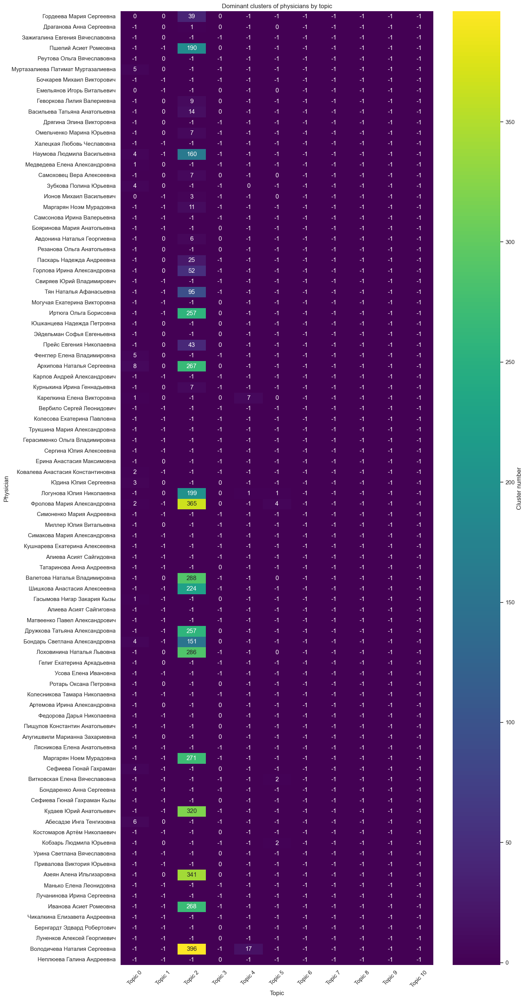

In [53]:
def create_physician_heatmap(data, num_topics):
    """
    Creates a heat map: for each doctor and topic - the most frequent cluster.
    """
    # Собираем данные
    pivot_data = []
    
    for physician in data['ФИО специалиста'].unique():
        phys_data = data[data['ФИО специалиста'] == physician]
        row = {'Specialist name': physician}
        
        for topic_id in range(num_topics):
            col = f'cluster_topic_{topic_id}'
            if col in phys_data.columns:
                valid = phys_data[col].dropna()
                if len(valid) > 0:
                    row[f'Topic {topic_id}'] = valid.mode().iloc[0]
                else:
                    row[f'Topic {topic_id}'] = -1
            else:
                row[f'Topic {topic_id}'] = -1
        
        pivot_data.append(row)
    
    df_pivot = pd.DataFrame(pivot_data).set_index('Specialist name')
    
    # Визуализация
    plt.figure(figsize=(14, max(8, len(df_pivot) * 0.3)))
    sns.heatmap(df_pivot, annot=True, cmap='viridis', fmt='.0f', 
                cbar_kws={'label': 'Cluster number'})
    plt.title('Dominant clusters of physicians by topic')
    plt.ylabel('Physician')
    plt.xlabel('Topic')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    return df_pivot

heatmap_data = create_physician_heatmap(data, num_topics=11)

In [54]:
def calculate_physician_diversity_metrics(data, num_topics):
    """
    Calculates metrics for the diversity of physician approaches:
    - How many different clusters are used in each topic
    - How evenly are recommendations distributed
    """
    diversity_metrics = []
    
    for physician in data['ФИО специалиста'].unique():
        phys_data = data[data['ФИО специалиста'] == physician]
        
        metrics = {
            'Specialist name': physician,
            'Total records': len(phys_data)
        }
        
        total_entropy = 0
        topics_count = 0
        
        for topic_id in range(num_topics):
            col = f'cluster_topic_{topic_id}'
            if col in phys_data.columns:
                valid = phys_data[col].dropna()
                if len(valid) > 0:
                    # Количество уникальных кластеров
                    n_clusters = valid.nunique()
                    metrics[f'Topic{topic_id}_unique_clusters'] = n_clusters
                    
                    # Энтропия распределения (равномерность)
                    probs = valid.value_counts(normalize=True)
                    entropy = -sum(p * np.log(p) for p in probs)
                    metrics[f'Topic{topic_id}_entropy'] = entropy
                    
                    total_entropy += entropy
                    topics_count += 1
                    
                    # Основной кластер
                    main_cluster = valid.mode().iloc[0] if len(valid.mode()) > 0 else -1
                    main_pct = (valid == main_cluster).sum() / len(valid)
                    metrics[f'Topic{topic_id}_main_cluster_share'] = main_pct
        
        metrics['Main_entropy'] = total_entropy / topics_count if topics_count > 0 else 0
        diversity_metrics.append(metrics)
    
    return pd.DataFrame(diversity_metrics)

diversity_df = calculate_physician_diversity_metrics(data, num_topics=11)

In [55]:
diversity_df

,Specialist name,Total records,Topic0_unique_clusters,Topic0_entropy,Topic0_main_cluster_share,Topic1_unique_clusters,Topic1_entropy,Topic1_main_cluster_share,Topic2_unique_clusters,Topic2_entropy,...,Topic3_unique_clusters,Topic3_entropy,Topic3_main_cluster_share,Topic4_unique_clusters,Topic4_entropy,Topic4_main_cluster_share,Main_entropy,Topic5_unique_clusters,Topic5_entropy,Topic5_main_cluster_share
0,Гордеева Мария Сергеевна,277,1.00,-0.00,1.00,1.00,-0.00,1.00,9.00,1.67,...,1.00,-0.00,1.00,1.00,-0.00,1.00,0.33,NaN,NaN,NaN
1,Драганова Анна Сергеевна,205,NaN,NaN,NaN,1.00,-0.00,1.00,6.00,1.14,...,1.00,-0.00,1.00,NaN,NaN,NaN,0.30,2.00,0.07,0.99
2,Зажигалина Евгения Вячеславовна,1866,NaN,NaN,NaN,1.00,-0.00,1.00,2.00,0.35,...,NaN,NaN,NaN,NaN,NaN,NaN,0.17,NaN,NaN,NaN
3,Пшепий Асиет Ромеовна,685,NaN,NaN,NaN,NaN,NaN,NaN,21.00,1.90,...,1.00,-0.00,1.00,1.00,-0.00,1.00,0.63,NaN,NaN,NaN
4,Реутова Ольга Вячеславовна,31,NaN,NaN,NaN,1.00,-0.00,1.00,4.00,1.20,...,NaN,NaN,NaN,NaN,NaN,NaN,0.60,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,Чикалкина Елизавета Андреевна,33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1.00,-0.00,1.00,0.00,NaN,NaN,NaN
86,Бернгардт Эдвард Робертович,12,1.00,-0.00,1.00,NaN,NaN,NaN,1.00,-0.00,...,1.00,-0.00,1.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN
87,Луненков Алексей Георгиевич,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.00,-0.00,1.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN
88,Володичева Наталия Сергеевна,14,NaN,NaN,NaN,NaN,NaN,NaN,2.00,0.67,...,NaN,NaN,NaN,1.00,-0.00,1.00,0.34,NaN,NaN,NaN


In [56]:
import plotly.graph_objects as go
import numpy as np

def visualize_physician_radar(physician_name, diversity_df, data, num_topics=6):
    """
    Создает радарную диаграмму для одного врача:
    - Энтропия по каждой теме (равномерность распределения)
    - Количество уникальных кластеров
    - Доля основного кластера
    """
    phys_row = diversity_df[diversity_df['Specialist name'] == physician_name].iloc[0]
    
    # Сбор данных по темам
    topics = [f'Topic{topic_id}' for topic_id in range(num_topics)]
    
    entropy_values = []
    unique_clusters = []
    main_cluster_share = []
    
    for topic_id in range(num_topics):
        entropy = phys_row.get(f'Topic{topic_id}_entropy', 0)
        n_clusters = phys_row.get(f'Topic{topic_id}_unique_clusters', 0)
        main_share = phys_row.get(f'Topic{topic_id}_main_cluster_share', 0)
        
        entropy_values.append(entropy)
        unique_clusters.append(n_clusters)
        main_cluster_share.append(main_share)
    
    fig = go.Figure()
    
    # Линия для энтропии (шкала 0-1.5)
    fig.add_trace(go.Scatterpolar(
        r=entropy_values,
        theta=topics,
        fill='toself',
        name='Entropy (uniformity)',
        line_color='blue',
        fillcolor='rgba(0,0,255,0.2)'
    ))
    
    # Линия для уникальных кластеров (шкала 0-5)
    fig.add_trace(go.Scatterpolar(
        r=unique_clusters,
        theta=topics,
        fill='toself',
        name='Unique clusters',
        line_color='orange',
        fillcolor='rgba(255,165,0,0.2)'
    ))
    
    # Линия для доли основного кластера (шкала 0-1)
    fig.add_trace(go.Scatterpolar(
        r=main_cluster_share,
        theta=topics,
        fill='toself',
        name='Main cluster share',
        line_color='green',
        fillcolor='rgba(0,255,0,0.2)'
    ))
    
    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, 1.5]  # Максимальное значение для нормировки
            )
        ),
        title=f'Physician Profile: {physician_name}<br><sub>Total recommendations: {phys_row["Total records"]}</sub>',
        showlegend=True,
        template='plotly_white',
        height=600
    )
    
    fig.show()

# Пример использования
visualize_physician_radar(data['ФИО специалиста'].iloc[0], diversity_df, data)

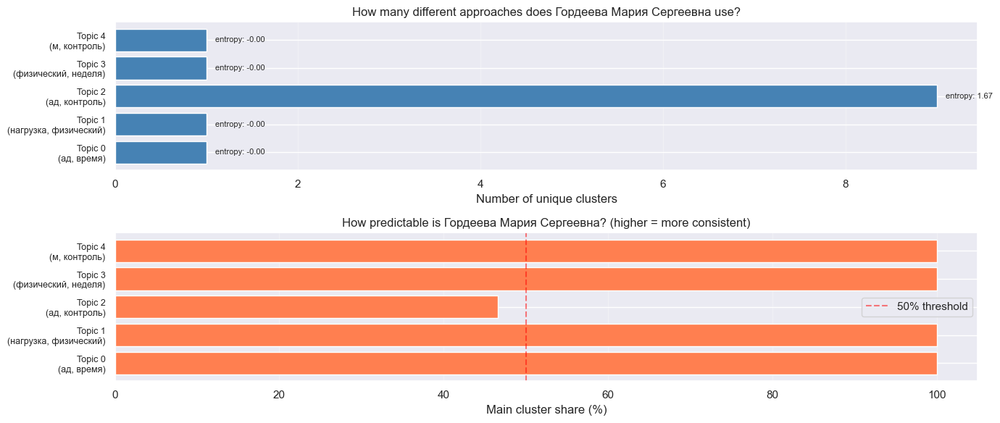


SUMMARY for Гордеева Мария Сергеевна:
   Total records: 277
   Overall entropy (avg): 0.334
   Most varied topic: Topic 2 (entropy=1.669)
   Most consistent topic: Topic 0


In [57]:
def visualize_physician_bars(physician_name, diversity_df, topic_top_words):
    """
    Горизонтальные бары для одного врача:
    - Слева: какие кластеры использует
    - Справа: равномерность (энтропия)
    """
    phys_row = diversity_df[diversity_df['Specialist name'] == physician_name].iloc[0]
    
    fig, axes = plt.subplots(2, 1, figsize=(14, max(6, len(topic_top_words) * 0.3)))
    
    # График 1: Количество уникальных кластеров по темам
    topics = []
    n_clusters_list = []
    entropy_list = []
    
    for topic_id in range(len(topic_top_words)):
        n_clusters = phys_row.get(f'Topic{topic_id}_unique_clusters', 0)
        if n_clusters > 0:
            topics.append(f'Topic {topic_id}\n({", ".join(topic_top_words[topic_id][:2])})')
            n_clusters_list.append(n_clusters)
            entropy_list.append(phys_row.get(f'Topic{topic_id}_entropy', 0))
    
    # Горизонтальные бары для кластеров
    y_pos = np.arange(len(topics))
    bars = axes[0].barh(y_pos, n_clusters_list, color='steelblue')
    axes[0].set_yticks(y_pos)
    axes[0].set_yticklabels(topics, fontsize=9)
    axes[0].set_xlabel('Number of unique clusters')
    axes[0].set_title(f'How many different approaches does {physician_name} use?')
    axes[0].grid(axis='x', alpha=0.3)
    
    # Добавляем аннотации
    for i, (bar, entropy) in enumerate(zip(bars, entropy_list)):
        axes[0].text(bar.get_width() + 0.1, bar.get_y() + bar.get_height()/2, 
                    f'entropy: {entropy:.2f}', va='center', fontsize=8)
    
    # График 2: Доля основного кластера (насколько врач предсказуем)
    main_shares = []
    for topic_id in range(len(topic_top_words)):
        main_share = phys_row.get(f'Topic{topic_id}_main_cluster_share', 0)
        if main_share > 0:
            main_shares.append(main_share * 100)
        else:
            main_shares.append(0)
    
    axes[1].barh(y_pos, main_shares[:len(y_pos)], color='coral')
    axes[1].set_yticks(y_pos)
    axes[1].set_yticklabels(topics, fontsize=9)
    axes[1].set_xlabel('Main cluster share (%)')
    axes[1].set_title(f'How predictable is {physician_name}? (higher = more consistent)')
    axes[1].grid(axis='x', alpha=0.3)
    
    # Добавляем вертикальную линию 50%
    axes[1].axvline(x=50, color='red', linestyle='--', alpha=0.5, label='50% threshold')
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()
    
    # Дополнительная статистика
    print(f"\nSUMMARY for {physician_name}:")
    print(f"   Total records: {phys_row['Total records']}")
    print(f"   Overall entropy (avg): {phys_row['Main_entropy']:.3f}")
    print(f"   Most varied topic: Topic {np.argmax(entropy_list)} (entropy={max(entropy_list):.3f})")
    print(f"   Most consistent topic: Topic {np.argmin([e for e in entropy_list if e > 0])}")

# Пример использования
visualize_physician_bars(data['ФИО специалиста'].iloc[0], diversity_df, topic_top_words)

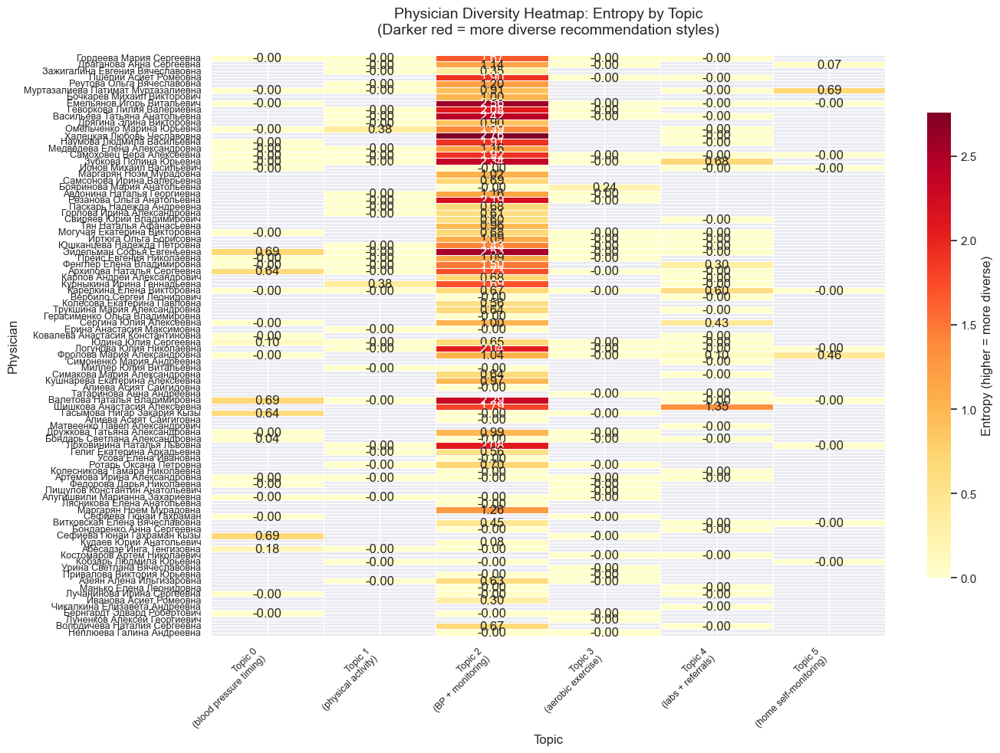


ENTROPY SUMMARY STATISTICS

Average entropy across all topics:
  Гордеева Мария Сергеевна: nan
  Драганова Анна Сергеевна: nan
  Зажигалина Евгения Вячеславовна: nan
  Пшепий Асиет Ромеовна: nan
  Реутова Ольга Вячеславовна: nan
  Муртазалиева Патимат Муртазалиевна: nan
  Бочкарев Михаил Викторович: nan
  Емельянов Игорь Витальевич: nan
  Геворкова Лилия Валериевна: nan
  Васильева Татьяна Анатольевна: nan
  Дрягина Элина Викторовна: nan
  Омельченко Марина Юрьевна: nan
  Халецкая Любовь Чеславовна: nan
  Наумова Людмила Васильевна: nan
  Медведева Елена Александровна: nan
  Самоховец Вера Алексеевна: 0.319
  Зубкова Полина Юрьевна: nan
  Ионов Михаил Васильевич: nan
  Маргарян Ноэм Мурадовна: nan
  Самсонова Ирина Валерьевна: nan
  Бояринова Мария Анатольевна: nan
  Авдонина Наталья Георгиевна: nan
  Резанова Ольга Анатольевна: nan
  Паскарь Надежда Андреевна: nan
  Горлова Ирина Александровна: nan
  Свиряев Юрий Владимирович: nan
  Тян Наталья Афанасьевна: nan
  Могучая Екатерина Ви

In [63]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def visualize_entropy_heatmap(diversity_df, num_topics=6, figsize=(14, 10)):
    """
    Creates a heatmap of entropy values for all physicians across all topics.
    
    Parameters:
    -----------
    diversity_df : pd.DataFrame
        DataFrame from calculate_physician_diversity_metrics() function
    num_topics : int
        Number of LDA topics (default = 6)
    figsize : tuple
        Figure size (width, height)
    
    Returns:
    --------
    pd.DataFrame : Entropy matrix (physicians × topics)
    """
    # Extract physician names
    physicians = diversity_df['Specialist name'].values
    
    # Extract entropy values for each topic
    topic_columns = [f'Topic{topic_id}_entropy' for topic_id in range(num_topics)]
    
    # Create entropy matrix (physicians × topics)
    entropy_matrix = []
    for _, row in diversity_df.iterrows():
        entropies = [row.get(col, 0) for col in topic_columns]
        entropy_matrix.append(entropies)
    
    entropy_matrix = np.array(entropy_matrix)
    
    # Create topic labels with names (optional)
    topic_names = [
        'Topic 0\n(blood pressure timing)',
        'Topic 1\n(physical activity)',
        'Topic 2\n(BP + monitoring)',
        'Topic 3\n(aerobic exercise)',
        'Topic 4\n(labs + referrals)',
        'Topic 5\n(home self-monitoring)'
    ]
    
    # Create figure
    plt.figure(figsize=figsize)
    
    # Plot heatmap
    ax = sns.heatmap(
        entropy_matrix,
        xticklabels=topic_names,
        yticklabels=physicians,
        cmap='YlOrRd',  # Yellow-Orange-Red (red = higher entropy)
        annot=True,     # Show values
        fmt='.2f',
        cbar_kws={'label': 'Entropy (higher = more diverse)', 'shrink': 0.8},
        linewidths=0.5,
        linecolor='white'
    )
    
    # Customize
    ax.set_title('Physician Diversity Heatmap: Entropy by Topic\n(Darker red = more diverse recommendation styles)', 
                 fontsize=14, pad=20)
    ax.set_xlabel('Topic', fontsize=12)
    ax.set_ylabel('Physician', fontsize=12)
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right', fontsize=9)
    plt.yticks(fontsize=9)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print("\n" + "="*60)
    print("ENTROPY SUMMARY STATISTICS")
    print("="*60)
    
    # Average entropy per physician
    avg_entropy = np.mean(entropy_matrix, axis=1)
    print(f"\nAverage entropy across all topics:")
    for i, physician in enumerate(physicians):
        print(f"  {physician}: {avg_entropy[i]:.3f}")
    
    print(f"\nMost diverse physician (highest avg entropy):")
    max_idx = np.argmax(avg_entropy)
    print(f"  {physicians[max_idx]}: {avg_entropy[max_idx]:.3f}")
    
    print(f"\nMost consistent physician (lowest avg entropy):")
    min_idx = np.argmin(avg_entropy)
    print(f"  {physicians[min_idx]}: {avg_entropy[min_idx]:.3f}")
    
    # Average entropy per topic
    avg_per_topic = np.mean(entropy_matrix, axis=0)
    print(f"\nAverage entropy per topic:")
    for i, topic in enumerate(topic_names):
        print(f"  {topic.replace(chr(10), ' ')}: {avg_per_topic[i]:.3f}")
    
    return pd.DataFrame(entropy_matrix, index=physicians, columns=topic_names)

# Usage
entropy_heatmap_df = visualize_entropy_heatmap(diversity_df, num_topics=6)

In [58]:
import ipywidgets as widgets
from IPython.display import display

def create_physician_dashboard(diversity_df, data, topic_top_words):
    """
    Создает интерактивный дашборд с выбором врача из выпадающего списка.
    """
    physicians = sorted(diversity_df['Specialist name'].unique())
    
    # Виджет выбора врача
    physician_dropdown = widgets.Dropdown(
        options=physicians,
        value=physicians[0],
        description='Physician:',
        style={'description_width': 'initial'}
    )
    
    # Виджет выбора метрики
    metric_dropdown = widgets.Dropdown(
        options=['Unique clusters', 'Entropy', 'Main cluster share (%)'],
        value='Unique clusters',
        description='Metric:',
        style={'description_width': 'initial'}
    )
    
    output = widgets.Output()
    
    def update_dashboard(change):
        with output:
            output.clear_output(wait=True)
            physician = physician_dropdown.value
            metric = metric_dropdown.value
            
            phys_row = diversity_df[diversity_df['Specialist name'] == physician].iloc[0]
            
            # Сбор данных
            topics = []
            values = []
            
            for topic_id in range(len(topic_top_words)):
                if metric == 'Unique clusters':
                    val = phys_row.get(f'Topic{topic_id}_unique_clusters', 0)
                elif metric == 'Entropy':
                    val = phys_row.get(f'Topic{topic_id}_entropy', 0)
                else:  # Main cluster share
                    val = phys_row.get(f'Topic{topic_id}_main_cluster_share', 0) * 100
                
                if val > 0 or metric == 'Unique clusters':
                    topics.append(f'T{topic_id}: {", ".join(topic_top_words[topic_id][:3])}')
                    values.append(val)
            
            # Визуализация
            fig, ax = plt.subplots(figsize=(12, max(5, len(topics) * 0.3)))
            
            colors = plt.cm.viridis(np.linspace(0, 1, len(values)))
            bars = ax.barh(topics, values, color=colors)
            
            ax.set_xlabel(metric)
            ax.set_title(f'{" ".join(physician.split()[-2:])} - {metric} by Topic\n(Total records: {phys_row["Total records"]})')
            ax.grid(axis='x', alpha=0.3)
            
            # Добавляем значения на бары
            for bar, val in zip(bars, values):
                ax.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2, 
                       f'{val:.2f}', va='center', fontsize=9)
            
            plt.tight_layout()
            plt.show()
            
            # Дополнительная информация
            print(f"\nInterpretation for {' '.join(physician.split()[-2:])}:")
            print(f"   Average entropy: {phys_row['Main_entropy']:.3f}")
            
            if phys_row['Main_entropy'] > 0.8:
                print("   → Highly variable: uses diverse approaches")
            elif phys_row['Main_entropy'] > 0.4:
                print("   → Moderately variable: some consistency, some variation")
            else:
                print("   → Highly consistent: prefers one dominant approach")
    
    physician_dropdown.observe(update_dashboard, names='value')
    metric_dropdown.observe(update_dashboard, names='value')
    
    display(physician_dropdown, metric_dropdown, output)
    update_dashboard(None)

# Запуск дашборда
create_physician_dashboard(diversity_df, data, topic_top_words)

Dropdown(description='Physician:', options=('Абесадзе Инга Тенгизовна', 'Авдонина Наталья Георгиевна', 'Азеян …

Dropdown(description='Metric:', options=('Unique clusters', 'Entropy', 'Main cluster share (%)'), style=Descri…

Output()

In [59]:
# Финальная функция для экспорта результатов
def export_physician_analysis(data, diversity_df, topic_top_words):
    """
    Экспортирует полный анализ по врачам в Excel.
    """
    with pd.ExcelWriter('physician_diversity_analysis.xlsx') as writer:
        # Лист 1: Сводные метрики
        diversity_df.to_excel(writer, sheet_name='Diversity_Metrics', index=False)
        
        # Лист 2: Интерпретация для каждого врача
        interpretations = []
        for _, row in diversity_df.iterrows():
            interpret = {
                'Specialist name': row['Specialist name'],
                'Total records': row['Total records'],
                'Avg entropy': row['Main_entropy'],
                'Style': 'Diverse' if row['Main_entropy'] > 0.7 else 'Mixed' if row['Main_entropy'] > 0.4 else 'Consistent'
            }
            interpretations.append(interpret)
        
        pd.DataFrame(interpretations).to_excel(writer, sheet_name='Interpretation', index=False)
        
        # Лист 3: Детали по темам для каждого врача
        topic_details = []
        for _, row in diversity_df.iterrows():
            for topic_id in range(6):
                topic_details.append({
                    'Specialist name': row['Specialist name'],
                    'Topic': topic_id,
                    'Topic_keywords': ', '.join(topic_top_words.get(topic_id, [])[:5]),
                    'Unique_clusters': row.get(f'Topic{topic_id}_unique_clusters', 0),
                    'Entropy': row.get(f'Topic{topic_id}_entropy', 0),
                    'Main_cluster_share': row.get(f'Topic{topic_id}_main_cluster_share', 0)
                })
        
        pd.DataFrame(topic_details).to_excel(writer, sheet_name='Topic_Details', index=False)
    
    print("Analysis exported to 'physician_diversity_analysis.xlsx'")

export_physician_analysis(data, diversity_df, topic_top_words)

Analysis exported to 'physician_diversity_analysis.xlsx'


PHYSICIAN PORTRAIT: Мария Сергеевна
Total recomendations: 277


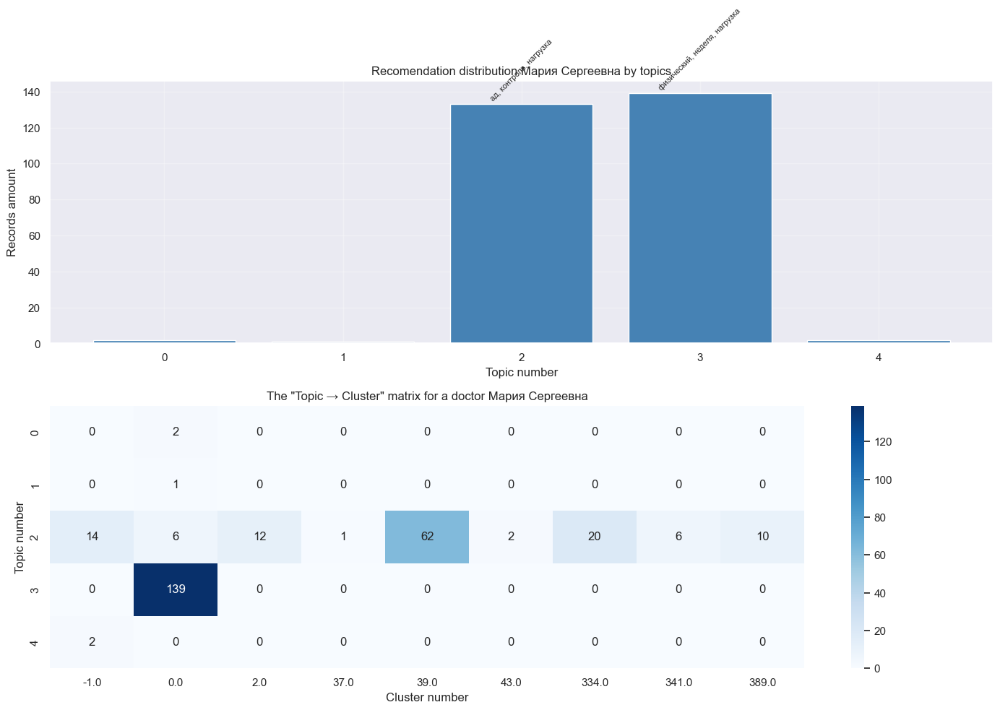


INTERPRETATION:

Topic 0 (ад, время, минута, мм, ст):
   2 recommendations (0.7%)
   The main approach: CLuster 0.0 (100.0% cases)

Topic 1 (нагрузка, физический, менее, контроль, снижение):
   1 recommendations (0.4%)
   The main approach: CLuster 0.0 (100.0% cases)

Topic 2 (ад, контроль, нагрузка, пульс, дневник):
   133 recommendations (48.0%)
   The main approach: CLuster 39.0 (46.6% cases)

Topic 3 (физический, неделя, нагрузка, умеренный, менее):
   139 recommendations (50.2%)
   The main approach: CLuster 0.0 (100.0% cases)

Topic 4 (м, контроль, кровь, кардиолог, экг):
   2 recommendations (0.7%)
   The main approach: CLuster -1.0 (100.0% cases)


In [60]:
def visualize_physician_portrait(data, physician_name, topic_top_words, num_topics=11):
    """
    Creates a detailed portrait of a specific doctor.
    """
    phys_data = data[data['ФИО специалиста'] == physician_name]
    
    print(f"=" * 60)
    print(f'PHYSICIAN PORTRAIT: {" ".join(physician_name.split()[-2:])}')
    print(f"Total recomendations: {len(phys_data)}")
    print(f"=" * 60)
    
    fig, axes = plt.subplots(2, 1, figsize=(14, 10))
    
    # Graph 1: Distribution by topics
    topic_dist = phys_data['dominant_topic'].value_counts().sort_index()
    axes[0].bar(topic_dist.index, topic_dist.values, color='steelblue')
    axes[0].set_xlabel('Topic number')
    axes[0].set_ylabel('Records amount')
    axes[0].set_title(f'Recomendation distribution {" ".join(physician_name.split()[-2:])} by topics')
    axes[0].grid(True, alpha=0.3)
    
    # Topic captions on the graph
    for topic_id, count in topic_dist.items():
        if count > 5:  # Show captions only for important topics
            top_words = topic_top_words.get(topic_id, [])[:3]
            words_str = ', '.join(top_words)
            axes[0].text(topic_id, count + 2, words_str, ha='center', fontsize=8, rotation=45)
    
    # Graph 2: Doctor's "Signature" (which clusters it uses)
    cluster_cols = [f'cluster_topic_{i}' for i in range(num_topics)]
    cluster_data = []
    
    for topic_id in range(num_topics):
        col = f'cluster_topic_{topic_id}'
        if col in phys_data.columns:
            valid = phys_data[col].dropna()
            if len(valid) > 0:
                for cluster_id in valid.unique():
                    count = (valid == cluster_id).sum()
                    cluster_data.append({
                        'Topic': topic_id,
                        'Cluster': cluster_id,
                        'Amount': count
                    })
    
    if cluster_data:
        cluster_df = pd.DataFrame(cluster_data)
        pivot_cluster = cluster_df.pivot(index='Topic', columns='Cluster', values='Amount').fillna(0)
        
        sns.heatmap(pivot_cluster, annot=True, cmap='Blues', fmt='.0f', ax=axes[1])
        axes[1].set_title(f'The "Topic → Cluster" matrix for a doctor {" ".join(physician_name.split()[-2:])}')
        axes[1].set_xlabel('Cluster number')
        axes[1].set_ylabel('Topic number')
    
    plt.tight_layout()
    plt.show()
    
    # Текстовое описание
    print("\n" + "=" * 60)
    print("INTERPRETATION:")
    print("=" * 60)
    
    for topic_id in topic_dist.index[:5]:  # Top-5 topics
        top_words = topic_top_words.get(topic_id, [])[:5]
        count = topic_dist[topic_id]
        pct = count / len(phys_data) * 100
        
        col = f'cluster_topic_{topic_id}'
        if col in phys_data.columns:
            valid = phys_data[col].dropna()
            if len(valid) > 0:
                main_cluster = valid.mode().iloc[0]
                cluster_pct = (valid == main_cluster).sum() / len(valid) * 100
                print(f"\nTopic {topic_id} ({', '.join(top_words)}):")
                print(f"   {count} recommendations ({pct:.1f}%)")
                print(f"   The main approach: CLuster {main_cluster} ({cluster_pct:.1f}% cases)")

# Example of usage
visualize_physician_portrait(data, data['ФИО специалиста'].iloc[0], topic_top_words)

In [61]:
def create_master_summary(data, num_topics=11):
    """
    Creates a pivot table for export and further analysis.
    """
    summary = data.copy()
    
    # For each topic, we add a text description of the cluster
    for topic_id in range(num_topics):
        cluster_col = f'cluster_topic_{topic_id}'
        if cluster_col in summary.columns:
            # Add a human-readable description
            summary[f'Topic{topic_id}_style'] = summary[cluster_col].apply(
                lambda x: f'Style_{int(x)}' if pd.notna(x) and x >= 0 else 'noise' if pd.notna(x) else 'no_data'
            )
    
    return summary

master_summary = create_master_summary(data)
master_summary.to_csv('physician_portraits_summary.csv', index=False)
print("Pivot table saved in 'physician_portraits_summary.csv'")

Pivot table saved in 'physician_portraits_summary.csv'


In [62]:
pd.read_csv('physician_portraits_summary.csv')

,Регистрационный номер,Номер эпизода,ФИО специалиста,Дата время выполнения,processed_text,dominant_topic,cluster_topic_0,cluster_topic_1,cluster_topic_2,cluster_topic_3,cluster_topic_4,cluster_topic_5,Topic0_style,Topic1_style,Topic2_style,Topic3_style,Topic4_style,Topic5_style
0,6612/A19,13654/А2019,Гордеева Мария Сергеевна,2019-03-06 15:00:00.000,режим нагрузка общий рекомендация контроль дав...,2,NaN,NaN,0.00,NaN,NaN,NaN,no_data,no_data,Style_0,no_data,no_data,no_data
1,5382/A19,NaN,Гордеева Мария Сергеевна,2019-03-06 15:30:00.000,режим нагрузка общий рекомендация ограничение ...,0,0.00,NaN,NaN,NaN,NaN,NaN,Style_0,no_data,no_data,no_data,no_data,no_data
2,16663/A19,NaN,Гордеева Мария Сергеевна,2019-03-06 17:30:00.000,режим нагрузка общий рекомендация контроль дав...,2,NaN,NaN,0.00,NaN,NaN,NaN,no_data,no_data,Style_0,no_data,no_data,no_data
3,16322/A19,NaN,Гордеева Мария Сергеевна,2019-03-07 18:00:00.000,режим нагрузка общий рекомендация контроль ад ...,2,NaN,NaN,-1.00,NaN,NaN,NaN,no_data,no_data,noise,no_data,no_data,no_data
4,18353/A19,NaN,Гордеева Мария Сергеевна,2019-03-12 12:30:00.000,режим нагрузка общий рекомендация контроль дав...,3,NaN,NaN,NaN,0.00,NaN,NaN,no_data,no_data,no_data,Style_0,no_data,no_data
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28119,134938/A24,156695/А2024,Драганова Анна Сергеевна,2024-12-28 13:00:00.000,ежедневный контроль артериальный давление пуль...,3,NaN,NaN,NaN,0.00,NaN,NaN,no_data,no_data,no_data,Style_0,no_data,no_data
28120,141111/A24,160865/А2024,Федорова Дарья Николаевна,2024-12-28 13:30:00.000,дозированные физический нагрузка мина менее не...,3,NaN,NaN,NaN,0.00,NaN,NaN,no_data,no_data,no_data,Style_0,no_data,no_data
28121,47611/A21,160923/А2024,Зажигалина Евгения Вячеславовна,2024-12-28 15:00:00.000,коррекция вес снижение избыточный масса тело и...,1,NaN,0.00,NaN,NaN,NaN,NaN,no_data,Style_0,no_data,no_data,no_data,no_data
28122,113232/A24,160950/А2024,Архипова Наталья Сергеевна,2024-12-28 16:30:00.000,прогулка контроль ад,2,NaN,NaN,267.00,NaN,NaN,NaN,no_data,no_data,Style_267,no_data,no_data,no_data
